# **Домашнее задание №1 (pro). Часть 1**

В этом домашнем задании (его первой части) вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;


> Оценка за первую часть домашки = $min(\text{ваш балл}, 7)$



**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [1]:
!pip install ydata_profiling

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 398.7/398.7 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 12.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 47.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.7/679.7 kB 23.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 2.0 MB/s eta 0:00:00


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
from ydata_profiling import ProfileReport

random.seed(42)
np.random.seed(42)

### **Задание 0**
Давайте зафиксируем важный момент.

**Задание 0 (0 баллов).**
Изучите и ответье на вопрос: для чего фиксируем сиды в домашках?

`Your answer here` Сиды фиксируем для воспроизводимости результатов

# **Часть 1 | EDA**


Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (1.7 балла)
- Визуализации признаков и их анализ (1.6 балл)

Всего можно набрать 3.3 основных балла и 0.25 бонусных.

В следующих частях, вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (1.7 балла)**

In [3]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1.(0.4 балла)**
Выполните операции, направленные на базовое исследование данных:

- [ ] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [ ] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)
- [ ] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла).

In [4]:
df_train.isna().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,202
engine,202


In [5]:
df_test.isna().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,19
engine,19


В трейне и тестовой выборках есть пропуски в следующих столбцах: mileage, engine, max_power, torque, seats

In [6]:
df_train.duplicated().sum()

np.int64(985)

In [7]:
df_test.duplicated().sum()

np.int64(62)

В выборках есть дубликаты

In [8]:
profile = ProfileReport(df_train)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 30.71it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
profile = ProfileReport(df_train)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:01<00:00, 10.96it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Ваш ответ здесь.**  
Выводы: в данных существует достаточное количество дубликатов ~7% трейн датасета.  
В некоторых столбцах наблюдаются пропуски:
1. mileage - 2.9% пропусков
2. engine - 2.9% пропусков
3. max_power - 2.8% пропусков
4. torque - 2.9% пропусков
4. seats - 2.9% пропусков  

Количество пропусков некритично, можно будет их заполнить самым частым значением, либо найти другой способ заполнения пропусков.

Несбалансированные данные в столбце seller_type, большая часть значений (~83.2%) это значение Individual. Это может мешать обучить эффективную модель.
Также несбалансированные данные есть в transmission, ~87.1% значение manual.

### **Задание 2 (0.2 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?
- [ ] Сделайте выводы по статистикам. Отсутсвие выводов равносильно по баллам невыполнению задания.

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

In [10]:
df_train.describe()

,year,selling_price,km_driven,seats
count,6999.000000,6.999000e+03,6.999000e+03,6797.000000
mean,2013.818403,6.395152e+05,6.958462e+04,5.419008
std,4.053095,8.089419e+05,5.772400e+04,0.965767
min,1983.000000,2.999900e+04,1.000000e+00,2.000000
25%,2011.000000,2.549990e+05,3.500000e+04,5.000000
50%,2015.000000,4.500000e+05,6.000000e+04,5.000000
75%,2017.000000,6.750000e+05,9.700000e+04,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000


In [11]:
df_test.describe()

,year,selling_price,km_driven,seats
count,1000.000000,1.000000e+03,1000.000000,981.000000
mean,2013.681000,6.179010e+05,71393.341000,5.410805
std,4.012149,7.585539e+05,48486.218662,0.919985
min,1995.000000,3.100000e+04,1303.000000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,9.000000


In [12]:
df_train.describe(include="object")

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,6999,6999,6999,6999,6999,6797,6797,6803,6796
unique,1924,4,3,2,5,386,120,316,419
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
freq,116,3793,5826,6095,4587,197,885,330,468


In [13]:
df_test.describe(include="object")

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,1000,1000,1000,1000,1000,981,981,981,981
unique,621,4,3,2,5,237,88,182,226
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner,18.6 kmpl,1248 CC,74 bhp,200Nm@ 1750rpm
freq,15,534,837,877,623,23,116,43,57


In [14]:
info_train = df_train.describe().loc[['mean', '50%']]
info_test = df_test.describe().loc[['mean', '50%']]
pd.concat([info_train, info_test])

,year,selling_price,km_driven,seats
mean,2013.818403,639515.197171,69584.615517,5.419008
50%,2015.000000,450000.000000,60000.000000,5.000000
mean,2013.681000,617901.042000,71393.341000,5.410805
50%,2014.000000,434999.000000,61500.000000,5.000000


Вывод по средним и медианам: в трейн выборке у некоторых столбцов значения распределены больше в правую сторону, это значения year, selling_price, т.к. у этих значений медианы и средние больше чем у тестовой выборке.  
В столбце km_driven значения тестовой выборке распределены правее чем у трейн теста. В столбец seats большой разницы нет.

Вывод по статистикам: в числовых столбцах вполне вероятно есть выбросы, т.к присутствуют значения (max/min) которые очень далеки от либо 75% персентиля либо 25%  персентиля. Вероятно выбросов в тестовой выборке меньше чем в трейн.  
В категориальных столбцах присутствуют значения которые вероятно можно преобразовать в численные: max_power, mileage, torque. В этих столбцах большое количество уникальных значений. Столбцы fuel, seller_type, transmission, owner можно будет легко преобразовать в one-hot encoding.

### **Задание 3 (0.2 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.01 балла)
- [ ] Отобразите такие объекты (0.01 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.01 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.01 балла)
- [ ] Подумайте, могут ли в данных быть другие скрытые дубли? Предложите, как их можно отлавливать. (0.16 балла)

P.S тут данные без подвоха, но выводы нам нужны.

In [15]:
df_train.drop('selling_price', axis=1).duplicated().sum()

np.int64(1159)

In [16]:
df_train[df_train.drop('selling_price', axis=1).duplicated()]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
254,Hyundai Grand i10 Sportz,2017,450000,35000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,82 bhp,114Nm@ 4000rpm,5.0
258,Maruti Swift VXI,2012,330000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
268,Maruti Swift Dzire VXI,2014,400000,70000,Petrol,Individual,Manual,Second Owner,19.1 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,2625000,9000,Diesel,Dealer,Automatic,First Owner,13.6 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0
325,Lexus ES 300h,2019,5150000,20000,Petrol,Dealer,Automatic,First Owner,22.37 kmpl,2487 CC,214.56 bhp,202Nm@ 3600-5200rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6947,Chevrolet Spark 1.0 LS,2010,140000,60000,Petrol,Individual,Manual,Second Owner,18.0 kmpl,995 CC,62 bhp,90.3Nm@ 4200rpm,5.0
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,746000,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63 bhp,215Nm@ 1750-3000rpm,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


In [17]:
columns_without_label = df_train.columns.drop('selling_price')
df_train = df_train.drop_duplicates(subset=columns_without_label, keep='first')

In [18]:
df_train = df_train.reset_index(drop=True)
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92 kmpl,1086 CC,62.1 bhp,96.1Nm@ 3000rpm,5.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.9 kmpl,998 CC,67.1 bhp,90Nm@ 3500rpm,5.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0


In [19]:
assert df_train.shape == (5840, 13)

Дубликаты возможные если есть опечатки в названии автомобиля. Возможно есть опечатки, либо другой формат записи в столбцах milage, engine, max_power, torque.
Чтобы их отлавливать необходимо будет распарсить строки этих столбцов, возможно стоит будет оставить только числовые значения после парсинга этих строк.

### **Задание 4 (0.3 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

In [20]:
import re

def transform_columns(df):
    def transform_val(value):
        if pd.isna(value):
            return np.nan
        try:
            val = pd.to_numeric(value.split()[0])
        except:
            # любые не numeric значения становятся nan
            return np.nan
        return val
    for i in ['mileage', 'engine', 'max_power']:
        df[i] = df[i].apply(transform_val)

def transform_torque(value):
    if pd.isna(value):
        return np.nan, np.nan

    value = value.lower().strip().replace(" ", "")

    if '(' in value:
        # единичные грязные данные хардкодим, нет смысл для них писать сложный парсер
        if value == '110(11.2)@4800':
            return 11.2, 4800
        if value == '380nm(38.7kgm)@2500rpm':
            return 38.7, 2500
        units = value.replace(")", "").split('(')

        unit_torq = units[1].split('@')[0]
        unit_rpm = units[1].split('@')[1]

        torq = pd.to_numeric(units[0].split('@')[0], errors='coerce')
        max_rpm = units[0].split('@')[1].replace(',', '')
        # некоторые max_rpm содержат диапазон значений типа 100-200
        # берем второе значение
        if '-' in max_rpm:
            max_rpm = max_rpm.split('-')[1]
        max_rpm = pd.to_numeric(max_rpm, errors='coerce')

        if unit_torq == 'nm':
            torq *= 0.10197

        return torq, np.nan
    else:
        def divide_num(s):
            for i, v in enumerate(s):
                if v.isalpha():
                    return s[:i], s[i:]
            return s, np.nan

        if '@' in value:
            units = value.split('@')
        elif 'at' in value:
            units = value.split('at')
        elif '/' in value:
            units = value.split('/')
        else:
            # есть грязные значения где не указан rpm вовсе
            torq = pd.to_numeric(divide_num(value)[0])
            unit_torq = divide_num(value)[1]
            if unit_torq == 'nm':
                torq *= 0.10197
            return torq, np.nan

        torq = pd.to_numeric(divide_num(units[0])[0])
        unit_torq = divide_num(units[0])[1]

        max_rpm = units[1].replace(',', '')
        # снова парсим диапазон значений и берем второе значение
        if '-' in max_rpm:
            max_rpm = max_rpm.split('-')[1]
        if '~' in max_rpm:
            max_rpm = max_rpm.split('~')[1]
        max_rpm = pd.to_numeric(divide_num(max_rpm)[0])

        if unit_torq == 'nm':
            torq *= 0.10197

        return torq, max_rpm

    return np.nan, np.nan

In [21]:
values = df_train['torque'].apply(transform_torque).tolist()
df_train['torque'] = pd.DataFrame(values)[0]
df_train['max_torque_rpm'] = pd.DataFrame(values)[1]
transform_columns(df_train)

values = df_test['torque'].apply(transform_torque).tolist()
df_test['torque'] = pd.DataFrame(values)[0]
df_test['max_torque_rpm'] = pd.DataFrame(values)[1]
transform_columns(df_test)
df_test

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.00,2498.0,112.00,26.512200,7.0,2200.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.50,1497.0,108.50,26.512200,5.0,2750.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.90,1799.0,130.00,17.538840,5.0,4300.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.10,1498.0,98.60,20.394000,5.0,1750.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.50,1172.0,65.00,9.789120,5.0,3000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81,1086.0,68.05,10.099109,5.0,4500.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.60,1197.0,81.83,11.695959,5.0,4000.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,22.400000,5.0,2750.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36,1197.0,78.90,11.400246,5.0,4000.0


Получился супер страшный код для трансформации torque. Идея простая, используем сложный парсер который будет парсить грязные данные из torque.  
По другим столбцам легче, просто используем split для строк, если не удалось трансформироать в numeric то отдаем nan.

### **Задание 5 (0.3 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [ ] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [ ] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`






In [22]:
medians = dict()
for i in ['mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm', 'seats']:
    medians[i] = df_train[i].median()
df_train = df_train.fillna(medians)
df_test = df_test.fillna(medians)

In [23]:
df_train.isna().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,0
engine,0


In [24]:
df_test.isna().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,0
engine,0


Медиану стоит выбирать т.к. это значение более стабильное к выбросам, чем среднее арифметическое. Мы уже наблюдали что в датасете возможно есть выбросы, поэтому стоит выбрать медиану.  
Для пропусков стоит использовать медиану только из трейн выборки, потому что мы обучаемся только на трейне, и использовать медианные значение должны только из трейна. Иначе модель будет как бы "подглядывать" если мы будет использовать медианное значение из тестовой выборки в тесте


### **Задание 6 (0.2 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.
- [ ] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

In [25]:
df_train['engine'] = df_train['engine'].astype(int)
df_train['seats'] = df_train['seats'].astype(int)
df_test['engine'] = df_test['engine'].astype(int)
df_test['seats'] = df_test['seats'].astype(int)
df_test

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.00,2498,112.00,26.512200,7,2200.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.50,1497,108.50,26.512200,5,2750.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.90,1799,130.00,17.538840,5,4300.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.10,1498,98.60,20.394000,5,1750.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.50,1172,65.00,9.789120,5,3000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81,1086,68.05,10.099109,5,4500.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.60,1197,81.83,11.695959,5,4000.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,22.400000,5,2750.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36,1197,78.90,11.400246,5,4000.0


In [26]:
len(df_train['seats'].unique())

9

`Your answer here` В seats всего 9 уникальных значений, это не так много и можно использовать как категориальную переменную.

### **Задание 7 (0.1 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [ ] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

In [27]:
df_train.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.430841,1429.448973,87.906371,18.224127,5.426712,3038.186301
std,4.095622,5.354320e+05,6.007114e+04,3.985973,485.662834,31.640418,14.628072,0.982344,864.794045
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,4.800000,2.000000,500.000000
25%,2011.000000,2.500000e+05,3.900000e+04,16.950000,1197.000000,68.000000,11.400246,5.000000,2400.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.370000,1248.000000,81.860000,16.315200,5.000000,3000.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.300000,1498.000000,99.000000,20.400000,5.000000,4000.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,510.000000,14.000000,5300.000000


In [28]:
df_test.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,1000.000000,1.000000e+03,1000.000000,1000.00000,1000.00000,1000.000000,1000.000000,1000.000000,1000.00000
mean,2013.681000,6.179010e+05,71393.341000,19.33881,1454.87600,90.841670,18.111648,5.403000,3080.89600
std,4.012149,7.585539e+05,48486.218662,3.95175,521.99574,34.893389,10.577874,0.912921,873.88384
min,1995.000000,3.100000e+04,1303.000000,0.00000,624.00000,34.200000,4.894560,4.000000,500.00000
25%,2011.000000,2.500000e+05,37000.000000,16.55000,1197.00000,69.000000,11.390049,5.000000,2500.00000
50%,2014.000000,4.349990e+05,61500.000000,19.37000,1248.00000,82.425000,16.315200,5.000000,3000.00000
75%,2017.000000,6.700000e+05,100000.000000,22.30000,1582.00000,102.000000,20.903850,5.000000,4000.00000
max,2020.000000,6.000000e+06,375000.000000,32.26000,3604.00000,280.000000,145.000000,9.000000,5200.00000


`Your answer here`: Можно предположить что заполнение пропусков сдвинуло распределения если пропусков было много. Как мы видели всего пропусков в каждом столбце было ~2.8%. Учитывая что всем пропущенным значениям указывалась медиана, то маловероятно что это как то существенно сдвинуло распределения.

## **Визуализации и корреляция (1.6 балла + 0.25)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

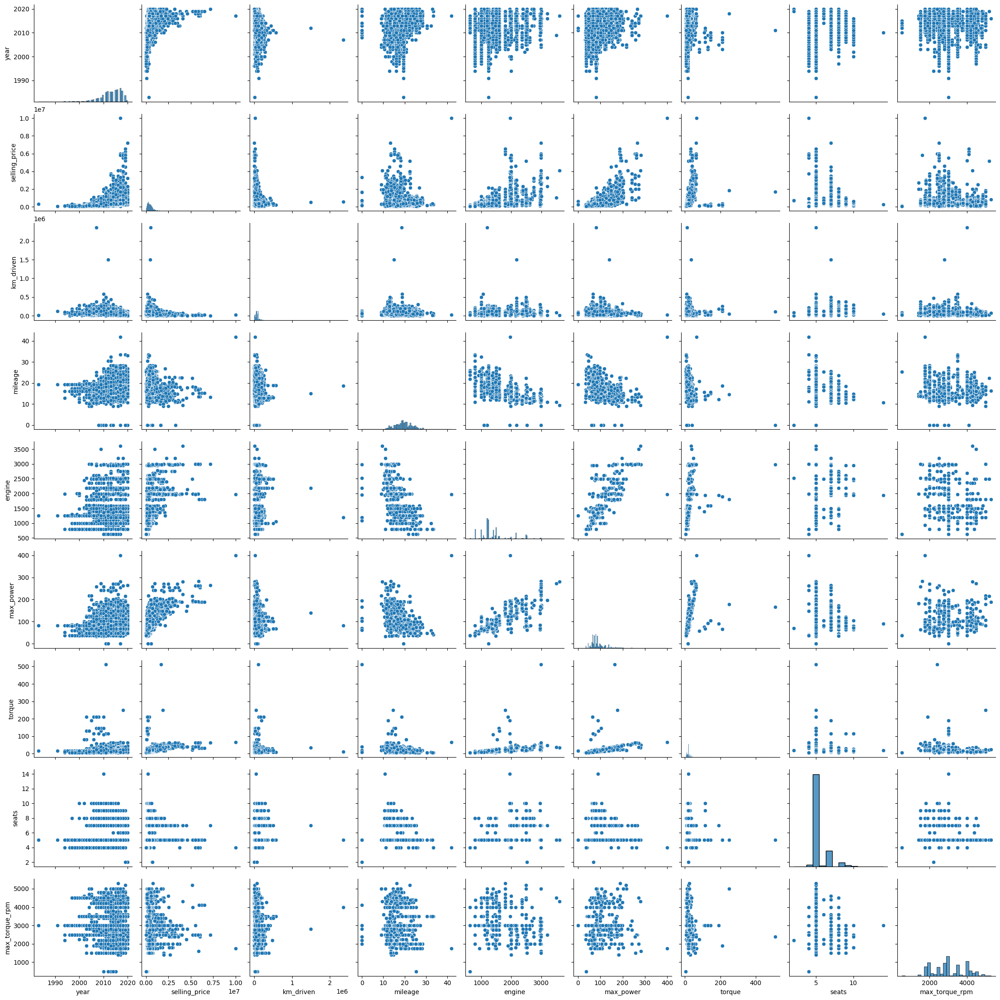

In [29]:
# your code here
sns.pairplot(df_train)

Связь признаков с целевой переменной безусловно есть, т.к. все графики с целевой переменной не выглядят хаотично, в некоторых даже можно наблюдать корреляцию, например связь selling_price и year, видно что новые автомобили более дорогие, чем старые. На основе этих графиков я думаю что можно предположить гипотезу о корреляциях признаков.

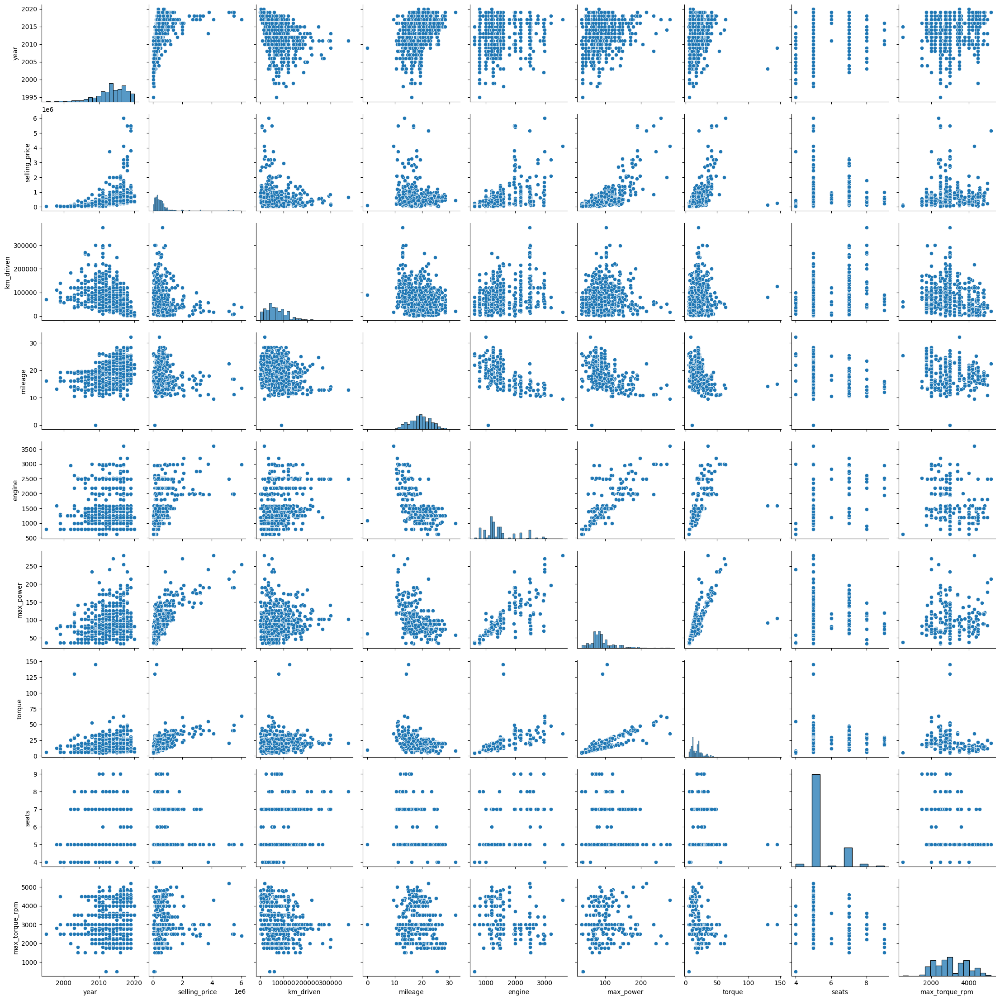

In [30]:
sns.pairplot(df_test)

В целом на графиках видно что тестовая выборка схожа по распределению с трейн выборкой.

### **Задание 9 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

In [31]:
train_corr = df_train.corr(method='pearson', numeric_only=True)
train_corr

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.000000,0.427279,-0.368966,0.341334,0.002819,0.156858,0.014653,0.041178,0.061150
selling_price,0.427279,1.000000,-0.164828,-0.104769,0.447672,0.692814,0.358071,0.149953,-0.088190
km_driven,-0.368966,-0.164828,1.000000,-0.182086,0.229766,0.024588,0.107426,0.192328,-0.215881
mileage,0.341334,-0.104769,-0.182086,1.000000,-0.572893,-0.373390,-0.209587,-0.451059,-0.184454
engine,0.002819,0.447672,0.229766,-0.572893,1.000000,0.681117,0.482225,0.652172,-0.254694
max_power,0.156858,0.692814,0.024588,-0.373390,0.681117,1.000000,0.502727,0.244112,-0.025381
torque,0.014653,0.358071,0.107426,-0.209587,0.482225,0.502727,1.000000,0.226038,-0.277080
seats,0.041178,0.149953,0.192328,-0.451059,0.652172,0.244112,0.226038,1.000000,-0.213411
max_torque_rpm,0.061150,-0.088190,-0.215881,-0.184454,-0.254694,-0.025381,-0.277080,-0.213411,1.000000


<Axes: >

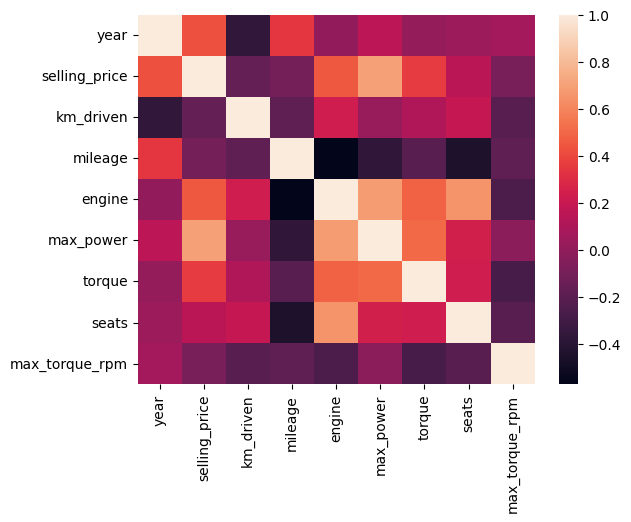

In [32]:
sns.heatmap(train_corr)

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?
 - Изучите типы корреляций в `pd.corr()`. Какую вы использовали по умолчанию?

`Your answer here`
1. Наименьшая корреляция у year и engine: 0.002819
2. Сильная положительная линейная связть между max_power и selling_price
3. Есть небольшая отрицательная корреляция (-0.368966), так что можно сказать что вероятно у старого автомобиля больше пройденных километров чем у нового. Но 100% утверждать нельзя.
4. Сущесвует 3 типа корреляции: pearson, kendall, spearman, по умолчанию используется Пирсон.

### **Задание 10 (0.6 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче, попробуйте измерить другие способы вычисления корреляций.

- [ ] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией
- [ ] Сделайте выводы


Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [ ] Проинтерпретируйте результаты


In [33]:
from collections import Counter

def calc_ranks(col):
    counter = Counter(col)
    ranks = dict()
    rank_counter = 1
    for i, v in sorted(counter.items()):
        if v > 1:
            ranks[i] = (((rank_counter + rank_counter + v - 1) * v) / 2) / v
            rank_counter += v
            continue
        ranks[i] = rank_counter
        rank_counter += 1

    rank_list = list()
    for i in col:
        rank_list.append(ranks[i])
    return rank_list

def custom_spearman(col1, col2):
    rank1 = calc_ranks(col1)
    rank2 = calc_ranks(col2)

    n = len(rank1)
    mean1 = sum(rank1) / n
    mean2 = sum(rank2) / n

    cov = sum((rank1[i] - mean1) * (rank2[i] - mean2) for i in range(n))
    std_x = (sum((r - mean1) ** 2 for r in rank1)) ** 0.5
    std_y = (sum((r - mean2) ** 2 for r in rank2)) ** 0.5

    return cov / (std_x * std_y)

def make_corr_table(df):
    columns = df.select_dtypes(include=np.number).columns
    corr = pd.DataFrame(np.nan, index=columns, columns=columns)
    for i in columns:
        for j in columns:
            corr.loc[i, j] = custom_spearman(df[i].to_numpy().copy(), df[j].to_numpy().copy())
    return corr

In [34]:
make_corr_table(df_train)

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.000000,0.707123,-0.569659,0.346132,-0.038056,0.165798,0.101258,0.048291,0.069750
selling_price,0.707123,1.000000,-0.295665,0.026186,0.463577,0.612258,0.580924,0.317605,-0.141741
km_driven,-0.569659,-0.295665,1.000000,-0.198466,0.304504,0.040919,0.244024,0.195317,-0.313709
mileage,0.346132,0.026186,-0.198466,1.000000,-0.429871,-0.308824,-0.162266,-0.435458,-0.182071
engine,-0.038056,0.463577,0.304504,-0.429871,1.000000,0.713113,0.842472,0.527716,-0.374932
max_power,0.165798,0.612258,0.040919,-0.308824,0.713113,1.000000,0.777419,0.304857,-0.049312
torque,0.101258,0.580924,0.244024,-0.162266,0.842472,0.777419,1.000000,0.437172,-0.541805
seats,0.048291,0.317605,0.195317,-0.435458,0.527716,0.304857,0.437172,1.000000,-0.202726
max_torque_rpm,0.069750,-0.141741,-0.313709,-0.182071,-0.374932,-0.049312,-0.541805,-0.202726,1.000000


In [35]:
df_train.corr(method='spearman', numeric_only=True)

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.000000,0.707123,-0.569659,0.346132,-0.038056,0.165798,0.101258,0.048291,0.069750
selling_price,0.707123,1.000000,-0.295665,0.026186,0.463577,0.612258,0.580924,0.317605,-0.141741
km_driven,-0.569659,-0.295665,1.000000,-0.198466,0.304504,0.040919,0.244024,0.195317,-0.313709
mileage,0.346132,0.026186,-0.198466,1.000000,-0.429871,-0.308824,-0.162266,-0.435458,-0.182071
engine,-0.038056,0.463577,0.304504,-0.429871,1.000000,0.713113,0.842472,0.527716,-0.374932
max_power,0.165798,0.612258,0.040919,-0.308824,0.713113,1.000000,0.777419,0.304857,-0.049312
torque,0.101258,0.580924,0.244024,-0.162266,0.842472,0.777419,1.000000,0.437172,-0.541805
seats,0.048291,0.317605,0.195317,-0.435458,0.527716,0.304857,0.437172,1.000000,-0.202726
max_torque_rpm,0.069750,-0.141741,-0.313709,-0.182071,-0.374932,-0.049312,-0.541805,-0.202726,1.000000


`Your answer here`: Результаты получились одинаковые

In [36]:
import phik

df_train.phik_matrix()

interval columns not set, guessing: ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']


/usr/local/lib/python3.12/dist-packages/phik/data_quality.py:59: UserWarning: The number of unique values of variable name is large: 1924. Are you sure this is not an interval variable? Analysis for pairs of variables including name can be slow.
  warnings.warn(


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
name,1.000000,0.948995,0.994871,0.000000,1.000000,0.799127,1.000000,0.830098,0.999690,1.000000,0.997906,0.999986,0.999985,0.999820
year,0.948995,1.000000,0.219841,0.081574,0.205834,0.232412,0.153714,0.418636,0.279253,0.213156,0.381639,0.108762,0.288178,0.339383
selling_price,0.994871,0.219841,1.000000,0.000000,0.157885,0.334505,0.463058,0.557641,0.649768,0.503682,0.872166,0.359995,0.196447,0.226137
km_driven,0.000000,0.081574,0.000000,1.000000,0.046285,0.000000,0.012824,0.087887,0.081625,0.210747,0.000000,0.000000,0.096223,0.081809
fuel,1.000000,0.205834,0.157885,0.046285,1.000000,0.050771,0.053721,0.030943,0.582304,0.644421,0.236006,0.044418,0.450714,0.682648
seller_type,0.799127,0.232412,0.334505,0.000000,0.050771,1.000000,0.127968,0.176612,0.064736,0.160346,0.331904,0.000000,0.032173,0.120253
transmission,1.000000,0.153714,0.463058,0.012824,0.053721,0.127968,1.000000,0.096990,0.331889,0.520161,0.511877,0.269037,0.045734,0.187615
owner,0.830098,0.418636,0.557641,0.087887,0.030943,0.176612,0.096990,1.000000,0.152406,0.186011,0.121438,0.025552,0.046741,0.251821
mileage,0.999690,0.279253,0.649768,0.081625,0.582304,0.064736,0.331889,0.152406,1.000000,0.588155,0.687235,0.288367,0.679979,0.391105
engine,1.000000,0.213156,0.503682,0.210747,0.644421,0.160346,0.520161,0.186011,0.588155,1.000000,0.720780,0.411636,0.603400,0.729410


Используя phik удалось построить матрицу со всеми столбцами.  
Значения немного отличаются от тех которые мы получили через корреляцию Спирмена и Пирсона.

### **Дополнительные визуализации (бонус 0.25 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.
Один график: 0.125 балла, при условии, что он обоснован.

Ответ: на мой взгляд, стоило бы добавить график ящик с усами, чтобы увидеть есть ли существенные выбросы, и оценить распределение.

<Axes: >

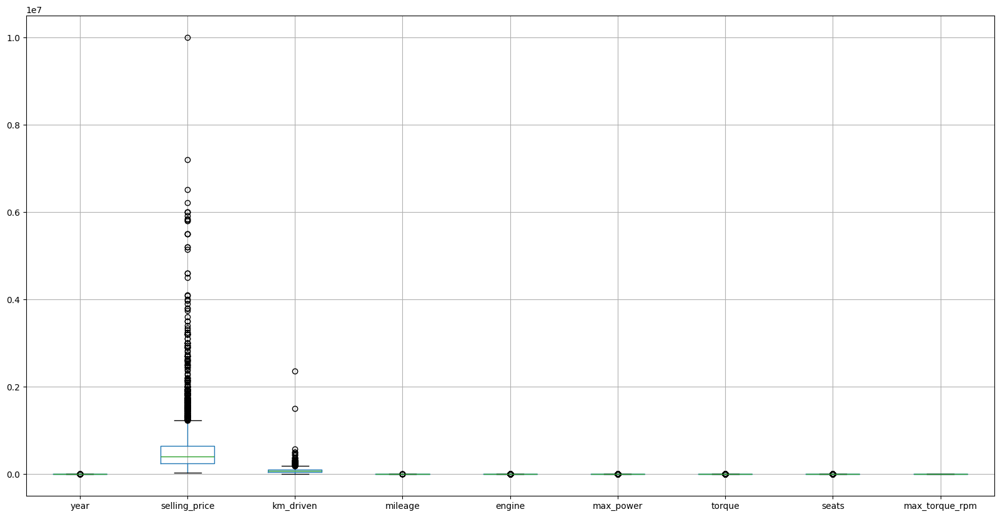

In [37]:
df_train.boxplot(figsize=(20, 10))

# **Часть 2 (1.7 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.05 балла)**

Сделайте на тренировочный и тестовый наборы. Она уже даны, достаточно просто отделить целевой признак. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных. Используйте уже имеющиеся данные train и test. Если считаете уместным применить какую-то более хитрую технику разбиения — примените, но опишите, зачем.

In [38]:
df_train_num = df_train.select_dtypes(include=np.number)
y_train = df_train_num['selling_price']
X_train = df_train_num.drop('selling_price', axis=1)

In [39]:
X_train.describe()

,year,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,5840.000000,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,7.395224e+04,19.430841,1429.448973,87.906371,18.224127,5.426712,3038.186301
std,4.095622,6.007114e+04,3.985973,485.662834,31.640418,14.628072,0.982344,864.794045
min,1983.000000,1.000000e+00,0.000000,624.000000,0.000000,4.800000,2.000000,500.000000
25%,2011.000000,3.900000e+04,16.950000,1197.000000,68.000000,11.400246,5.000000,2400.000000
50%,2014.000000,7.000000e+04,19.370000,1248.000000,81.860000,16.315200,5.000000,3000.000000
75%,2017.000000,1.000000e+05,22.300000,1498.000000,99.000000,20.400000,5.000000,4000.000000
max,2020.000000,2.360457e+06,42.000000,3604.000000,400.000000,510.000000,14.000000,5300.000000


In [40]:
df_test_num = df_test.select_dtypes(include=np.number)
y_test = df_test_num['selling_price']
X_test = df_test_num.drop('selling_price', axis=1)
X_test.describe()

,year,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,1000.000000,1000.000000,1000.00000,1000.00000,1000.000000,1000.000000,1000.000000,1000.00000
mean,2013.681000,71393.341000,19.33881,1454.87600,90.841670,18.111648,5.403000,3080.89600
std,4.012149,48486.218662,3.95175,521.99574,34.893389,10.577874,0.912921,873.88384
min,1995.000000,1303.000000,0.00000,624.00000,34.200000,4.894560,4.000000,500.00000
25%,2011.000000,37000.000000,16.55000,1197.00000,69.000000,11.390049,5.000000,2500.00000
50%,2014.000000,61500.000000,19.37000,1248.00000,82.425000,16.315200,5.000000,3000.00000
75%,2017.000000,100000.000000,22.30000,1582.00000,102.000000,20.903850,5.000000,4000.00000
max,2020.000000,375000.000000,32.26000,3604.00000,280.000000,145.000000,9.000000,5200.00000


### **Задание 12. (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [41]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

model_reg = LinearRegression()
model_reg.fit(X_train, y_train)

def print_quality(model, X_train, y_train, X_test, y_test):
    y_pred = model.predict(X_train)
    print(f"Train MSE: {MSE(y_train, y_pred)}")
    print(f"Train R2: {r2_score(y_train, y_pred)}")

    y_pred = model.predict(X_test)
    print(f"Test MSE: {MSE(y_test, y_pred)}")
    print(f"Test R2: {r2_score(y_test, y_pred)}")

print_quality(model_reg, X_train, y_train, X_test, y_test)

Train MSE: 114220104873.8604
Train R2: 0.6015183958705161
Test MSE: 229703658044.7325
Test R2: 0.6003962298121955


### **Задание 13 (0.15 балла)**

- [ ] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики

In [42]:
def custom_r2(y_test, y_pred):
    y_mean = sum(y_test) / len(y_test)
    rss = sum((y - y_p)**2 for y, y_p in zip(y_test, y_pred))
    tss = sum((y - y_mean)**2 for y in y_test)
    if tss == 0:
        return 1
    return 1 - (rss / tss)

In [43]:
y_pred = model_reg.predict(X_train)
custom_r2(y_train, y_pred)

np.float64(0.6015183958705164)

`Your answer here` Формула R2 = 1 - (RSS/TSS) где  
RSS - сумма квадратов разницы между реальный значением и предсказанным.  
TSS - сумма квадратов разницы между реальный значением и средним по выборке.  
Идеальная модель должна иметь R2 = 1. Очень плохие модели имеют отрицательное значение R2.

### **Бонус (0.15 балла)**

- [ ] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [ ] Объясните, когда применяется $\text{adjusted}-R^2$?

In [44]:
def adjusted_r2(y_test, y_pred, predicts):
    r2 = custom_r2(y_test, y_pred)
    n = len(y_test)
    return 1 - ((1 - r2) * (n - 1)) / (n - predicts - 1)

In [45]:
adjusted_r2(y_train, y_pred, len(model_reg.coef_))

np.float64(0.6009716881303284)

`Your answer here` С помощью adjusted R2 мы учитываем количество предиктов (независимые переменные), и штрафуем если у существуют предикты которые никак не влияют на результат. В R2 у нас может быть хоть сколько предиктов.

### **Задание 14 (0.05 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [46]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train)

X_train_std = scaler.transform(X_train)
X_test_std = scaler.transform(X_test)

model_reg_std = LinearRegression()
model_reg_std.fit(X_train_std, y_train)

print_quality(model_reg_std, X_train_std, y_train, X_test_std, y_test)

Train MSE: 114220104873.8607
Train R2: 0.601518395870515
Test MSE: 229703658044.7229
Test R2: 0.6003962298122123


Стандартизация почти вообще не повлияла на качество модели, что вполне ожидаемо, т.к. стандартизация не должна улучшать качество модели, но помогает облегчить обучение модели.

### **Задание 15 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [47]:
max_col = np.argmax(abs(model_reg_std.coef_))
X_train.columns[max_col]

'max_power'

max_power самый информативный признак

### **Задание 16 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [48]:
from sklearn.linear_model import Lasso

lasso = Lasso()
lasso.fit(X_train_std, y_train)

print_quality(lasso, X_train_std, y_train, X_test_std, y_test)

Train MSE: 114220104887.66551
Train R2: 0.601518395822354
Test MSE: 229704389546.97162
Test R2: 0.6003949572549574


In [49]:
lasso.coef_

array([167135.49586143, -49368.45533875, -10662.52425137,  20389.89146066,
       330883.89917459,   6044.45295175, -30428.96274654, -61287.51145033])

Lasso не обнулила ни один признак. Связанно это с тем что все числовые признаки так или иначе влияют на целевую переменную.

### **Задание 17. Финальный рывок (0.4 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [50]:
from sklearn.model_selection import GridSearchCV

lasso_cv = Lasso()
parameters = {
    'alpha': np.arange(0.01, 1, 0.05),
}
grid_lasso = GridSearchCV(lasso_cv, parameters, cv=10, verbose=1, scoring='neg_mean_squared_error')
grid_lasso.fit(X_train_std, y_train)

Fitting 10 folds for each of 20 candidates, totalling 200 fits


GridSearchCV(cv=10, estimator=Lasso(),
             param_grid={'alpha': array([0.01, 0.06, 0.11, 0.16, 0.21, 0.26, 0.31, 0.36, 0.41, 0.46, 0.51,
       0.56, 0.61, 0.66, 0.71, 0.76, 0.81, 0.86, 0.91, 0.96])},
             scoring='neg_mean_squared_error', verbose=1)

In [51]:
print_quality(grid_lasso, X_train_std, y_train, X_test_std, y_test)

Train MSE: 114220104886.57474
Train R2: 0.6015183958261594
Test MSE: 229704360246.43576
Test R2: 0.6003950082276094


In [52]:
grid_lasso.best_params_

{'alpha': np.float64(0.9600000000000001)}

In [53]:
grid_lasso.best_estimator_.coef_

array([167135.58843874, -49368.4930872 , -10662.66365194,  20389.96567257,
       330883.85412859,   6044.46353323, -30429.12176941, -61287.60422097])

Пришлось обучить 20 моделей. Использовался один параметр - alpha коэффициент регуляризации.
У лучшей модели значение alpha равна 0.96. Нет зануленных весов.

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [54]:
from sklearn.linear_model import ElasticNet

elastic = ElasticNet()
parameters = {
    'alpha': np.arange(0.01, 1, 0.05),
    'l1_ratio': np.arange(0.01, 1, 0.05),
}
grid_elastic = GridSearchCV(elastic, parameters, cv=10, verbose=1, scoring='neg_mean_squared_error')
grid_elastic.fit(X_train_std, y_train)

Fitting 10 folds for each of 400 candidates, totalling 4000 fits


GridSearchCV(cv=10, estimator=ElasticNet(),
             param_grid={'alpha': array([0.01, 0.06, 0.11, 0.16, 0.21, 0.26, 0.31, 0.36, 0.41, 0.46, 0.51,
       0.56, 0.61, 0.66, 0.71, 0.76, 0.81, 0.86, 0.91, 0.96]),
                         'l1_ratio': array([0.01, 0.06, 0.11, 0.16, 0.21, 0.26, 0.31, 0.36, 0.41, 0.46, 0.51,
       0.56, 0.61, 0.66, 0.71, 0.76, 0.81, 0.86, 0.91, 0.96])},
             scoring='neg_mean_squared_error', verbose=1)

In [55]:
print_quality(grid_elastic, X_train_std, y_train, X_test_std, y_test)

Train MSE: 114247037436.5228
Train R2: 0.6014244357854253
Test MSE: 231128694068.10406
Test R2: 0.5979171671257762


In [56]:
grid_elastic.best_params_

{'alpha': np.float64(0.26), 'l1_ratio': np.float64(0.9600000000000001)}

In [57]:
grid_elastic.best_estimator_.coef_

array([165574.14519667, -49788.93273952,  -8751.976726  ,  26505.377709  ,
       323540.1900304 ,   8101.73542119, -31172.8929176 , -58539.88152109])

Пришлось обучить 400 моделей. Использовались два параметра:
1. alpha - коэффициент регуляризации
2. l1_ratio - значение определяющая какая регуляризация будет сильнее штрафовать

У лучшей модели значение alpha равна 0.26. l1_ratio 0.96

### **Задание 18 (0.35 балла)**

И так, вы обучили все варианты регуляризаций, доступные в sklearn, но не все, что мы обсудили на занятии! И следующее задание о забытой - $L0$ регуляризации.


**Ваша задача:**>
- [ ] Реализуйте модель с $L0$-регуляризаицей.
- [ ] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [ ] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



In [58]:
import numpy as np
import itertools

class CustomLinearRegressionL0:
    def __init__(self, nonzero, lr=0.001, n_iter=1000):
        self.nonzero = nonzero
        self.lr = lr
        self.n_iter = n_iter

    def _mse(self, X, y, w, b):
        y_pred = X @ w + b
        return np.mean((y_pred - y) ** 2)

    def fit(self, X, y):
        n_samples, n_features = X.shape
        self.w = np.zeros(n_features)
        self.b = 0.0

        for _ in range(self.n_iter):
            y_pred = np.dot(X, self.w) + self.b

            grad_w = (2 / n_samples) * np.dot(X.T, y_pred - y)
            grad_b = (2 / n_samples) * np.sum(y_pred - y)

            # шаг градиентного спуска
            new_w = self.w - self.lr * grad_w
            self.b = self.b - self.lr * grad_b

            # перебираем все возможные комбинации с обнуленными весами и берем лучшую
            best_loss = self._mse(X, y, new_w, self.b)
            best_w = new_w
            for k in range(self.nonzero, n_features + 1):
                for subset in itertools.combinations(range(n_features), k):
                    w_combin = new_w.copy()
                    w_combin[list(subset)] = 0.0

                    mse_combin = self._mse(X, y, w_combin, self.b)
                    if mse_combin < best_loss:
                        best_loss = mse_combin
                        best_w = w_combin

            self.w = best_w

    def predict(self, X):
        return X @ self.w


In [59]:
custom_l0 = CustomLinearRegressionL0(5)
custom_l0.fit(X_train_std, y_train)
print_quality(custom_l0, X_train_std, y_train, X_test_std, y_test)

Train MSE: 392362963252.8841
Train R2: -0.36884328000462197
Test MSE: 583194105155.06
Test R2: -0.014553120986350976


In [60]:
print(custom_l0.w, custom_l0.b)

[153848.40373539 -61199.48511522   9453.47719652  84799.36309419
 237745.97628075  50154.69032364 -24080.11098144 -24362.98898302] 452326.736133347


Немного подсматривал здесь https://aiwiki.ai/wiki/L0_regularization  
L0 регуляризация подразумевает штрафы за ненулевые веса, т.к. функция получается не дифференцируемой, то я решил перебирать на каждый шаг комбинации весов где некоторые веса были занулены, и если комбинация весов выдет результат лучше, то оставить его таким.  
В моем кейсе ни один вес в итоге не был занулен.  
В итоге получилась модель которая долго обучается и плохо предсказывает :(

# **Часть 3 (0.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.1 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [61]:
X_train_cat = df_train.drop('selling_price', axis=1)
y_train_cat = df_train['selling_price']
X_train_cat['name'] = X_train_cat['name'].str.split().str[0]

X_test_cat = df_test.drop('selling_price', axis=1)
y_test_cat = df_test['selling_price']
X_test_cat['name'] = X_test_cat['name'].str.split().str[0]

In [ ]:
assert X_train_cat.shape == (5840, 11)

AssertionError: 

In [62]:
X_train_cat.describe(include='object')

,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,30,4,3,2,5
top,Maruti,Diesel,Individual,Manual,First Owner
freq,1804,3177,5223,5336,3603


Распарсили названия автомобилей и поменяли на название производителя.

### **Задание 20 (0.1 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

In [63]:
from sklearn.preprocessing import OneHotEncoder # или можно использовать get_dummies из библиотеки pandas

X_train_cat['seats'] = X_train_cat['seats'].astype('object')
X_train_cat = pd.get_dummies(X_train_cat, drop_first=True)
len(X_train_cat.columns)

54

In [64]:
X_test_cat['seats'] = X_test_cat['seats'].astype('object')
X_test_cat = pd.get_dummies(X_test_cat, drop_first=True)
missing_cols = set(X_train_cat.columns) - set(X_test_cat.columns)
for c in missing_cols:
    X_test_cat[c] = 0
X_test_cat = X_test_cat[X_train_cat.columns]
len(X_test_cat.columns)

54

### **Задание 21 (0.2 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?
* Почему мы удаляем один столбец?
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

`Your answer here`
1. Нужно точно определить что признак является категориальным, а не просто численным. Так же не стоит использовать OHE в случае если у нас много категорий.
2. Мы удаляем один столбец т.к. он является излишним и может внести мультиколлинеарность. Этот самый удаленый столбец может быть закодирован просто нулями во всех столбцах.
3. Если веса около нуля, то можно, в этом кейсе можно использовать Lasso и посмотреть занулил ли он веса.

### **Задание 22 (0.1 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [65]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

ridge = Ridge()
parameters = {
    'alpha': np.arange(0.1, 1, 0.1),
}
grid_ridge_cat = GridSearchCV(ridge, parameters, cv=10, verbose=1, scoring='r2')
grid_ridge_cat.fit(X_train_cat, y_train)

Fitting 10 folds for each of 9 candidates, totalling 90 fits


GridSearchCV(cv=10, estimator=Ridge(),
             param_grid={'alpha': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])},
             scoring='r2', verbose=1)

In [66]:
print_quality(grid_ridge_cat, X_train_cat, y_train, X_test_cat, y_test)

Train MSE: 65415838116.263954
Train R2: 0.7717826635089265
Test MSE: 125684397165.27675
Test R2: 0.7813532470987232


Качество удалось улучшить как и на трейне так и на тесте.
R2 был ~0.6 стал ~0.78

# **Часть 4 - бонусная (1 балл) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 1-х балла в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

In [67]:
X_new_features = X_train_cat.copy()
X_new_features_test = X_test_cat.copy()
for i in ["year", "km_driven", "mileage", "engine", "max_power", "torque", "max_torque_rpm"]:
    X_new_features[f"{i}_2"] = X_new_features[i] ** 2
    X_new_features_test[f"{i}_2"] = X_new_features_test[i] ** 2

In [68]:
ridge_new_featrues = Ridge()
parameters = {
    'alpha': np.arange(0.1, 1, 0.1),
}
grid_new_features = GridSearchCV(ridge_new_featrues, parameters, cv=10, verbose=1, scoring='r2')
grid_new_features.fit(X_new_features, y_train)

Fitting 10 folds for each of 9 candidates, totalling 90 fits


/usr/local/lib/python3.12/dist-packages/scipy/_lib/_util.py:1233: LinAlgWarning: Ill-conditioned matrix (rcond=2.71007e-27): result may not be accurate.
  return f(*arrays, *other_args, **kwargs)
/usr/local/lib/python3.12/dist-packages/scipy/_lib/_util.py:1233: LinAlgWarning: Ill-conditioned matrix (rcond=4.86348e-27): result may not be accurate.
  return f(*arrays, *other_args, **kwargs)
/usr/local/lib/python3.12/dist-packages/scipy/_lib/_util.py:1233: LinAlgWarning: Ill-conditioned matrix (rcond=5.63405e-27): result may not be accurate.
  return f(*arrays, *other_args, **kwargs)
/usr/local/lib/python3.12/dist-packages/scipy/_lib/_util.py:1233: LinAlgWarning: Ill-conditioned matrix (rcond=4.85637e-27): result may not be accurate.
  return f(*arrays, *other_args, **kwargs)
/usr/local/lib/python3.12/dist-packages/scipy/_lib/_util.py:1233: LinAlgWarning: Ill-conditioned matrix (rcond=2.6851e-26): result may not be accurate.
  return f(*arrays, *other_args, **kwargs)
/usr/local/lib/python

GridSearchCV(cv=10, estimator=Ridge(),
             param_grid={'alpha': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])},
             scoring='r2', verbose=1)

In [69]:
print_quality(grid_new_features, X_new_features, y_train, X_new_features_test, y_test)

Train MSE: 53238690013.07262
Train R2: 0.8142652852438719
Test MSE: 108294154771.69475
Test R2: 0.8116061672485707


Удалось немного улучшить модель добавив квадраты численных признаков.

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 23 (0.25 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [71]:
def business_metrics(y_true, y_pred):
    percents = ((y_pred - y_true) * 100) / y_true
    correct_predicts = abs(percents) <= 10
    return sum(correct_predicts) / len(correct_predicts)

print(f"LinearRegression: {business_metrics(model_reg.predict(X_test), y_test)}")
print(f"Lasso: {business_metrics(lasso.predict(X_test_std), y_test)}")
print(f"Grid Lasso: {business_metrics(grid_lasso.predict(X_test_std), y_test)}")
print(f"Grid Elastic: {business_metrics(grid_elastic.predict(X_test_std), y_test)}")
print(f"Grid Ridge + categorical: {business_metrics(grid_ridge_cat.predict(X_test_cat), y_test)}")
print(f"Grid Ridge + new features: {business_metrics(grid_new_features.predict(X_new_features_test), y_test)}")

LinearRegression: 0.245
Lasso: 0.245
Grid Lasso: 0.245
Grid Elastic: 0.245
Grid Ridge + categorical: 0.31
Grid Ridge + new features: 0.291


Лучше всего работает модель Ridge со всеми признаками, включая категориальные

### **Задание 24 (0.25 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [ ] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса



In [72]:
def your_business_metrics(y_true, y_pred):
    percents = ((y_pred - y_true) * 100) / y_true
    correct_predicts = ((percents >= 0) & (percents <= 15)) | ((percents <= 0) & (percents >= -5))
    return sum(correct_predicts) / len(correct_predicts)

print(f"LinearRegression: {your_business_metrics(model_reg.predict(X_test), y_test)}")
print(f"Lasso: {your_business_metrics(lasso.predict(X_test_std), y_test)}")
print(f"Grid Lasso: {your_business_metrics(grid_lasso.predict(X_test_std), y_test)}")
print(f"Grid Elastic: {your_business_metrics(grid_elastic.predict(X_test_std), y_test)}")
print(f"Grid Ridge + categorical: {your_business_metrics(grid_ridge_cat.predict(X_test_cat), y_test)}")
print(f"Grid Ridge + new features: {your_business_metrics(grid_new_features.predict(X_new_features_test), y_test)}")

LinearRegression: 0.231
Lasso: 0.231
Grid Lasso: 0.231
Grid Elastic: 0.231
Grid Ridge + categorical: 0.279
Grid Ridge + new features: 0.285


Создал метрику которая считает перепрогнозы которые ошиблись на 15% и недопрогнозы на 5%.  
Лучшее качество получилось у Ridge модели с новыми фичами.

# **<font color="green">Часть 5 | Создание интерактивного приложения на Streamlit (3 балла)</font>**

Вам необходимо создать интерактивное приложение на Streamlit, которое будет:

- Показывать основные информативные графики/гистограммы в рамках EDA (1 балл)
- На вход запрашивать csv-файл с признаками объектов или запрашивать признаки объекта в окошках для ввода, и применять на поступивших объектах модель (1 балл)
- Визуализировать веса обученной модели (1 балл)

# **Часть 6 | Оформление репозитория и оценка сервиса (3 балла)**

**Результаты вашей работы** необходимо разместить в своём GitHub-репозитории. В этот же репозиторий позже будет добавлена вторая часть.

Под результатами первой части понимаем следующее:

---

### Обязательные файлы:

1. **`.ipynb`-ноутбук** со всеми экспериментами:

   * полный EDA,
   * все шаги препроцессинга,
   * обучение и сравнение моделей,
   * сохранённые output’ы.

2. **`.pickle`-файл**, содержащий:

   * обученную модель (или пайплайн `scaler + model`);
   * параметры скейлинга;
   * любые числовые объекты, необходимые для инференса внутри Streamlit-приложения.

3. **`.md`-файл с выводами** о проделанной работе:

   * что было сделано (краткое описание каждого этапа);
   * какие результаты были получены (метрики + интерпретация);
   * что дало наибольший прирост качества;
   * что сделать не удалось и почему (это нормально и даже полезно);
   * **оценка разработанного сервиса**:

     * насколько приложение удобно в использовании;
     * что получилось визуализировать хорошо, а что — менее удачно;
     * какие ограничения или проблемы вы заметили;
     * какие улучшения планируете в следующей итерации.

По результатам второй части, ждем:

4. **Streamlit-приложение** (например, `app.py`), которое можно запустить командой:

   ```bash
   streamlit run app.py
   ```

В приложении должно быть:

* отображение ключевых графиков EDA;
* ввод данных (CSV или ручной ввод);
* применение модели;
* визуализация весов/коэффициентов.

**И ссылку на приложение в StreamlitHub.**


### **За что могут быть сняты баллы:**

* отсутствие `.pickle` с моделью / пайплайном;
* слабая или неполная аналитика в `.md`-файле;
* беспорядок в ноутбуке или неясная логика вычислений;
* отсутствие возможности запустить Streamlit-приложение.
